# Classification Model

In [16]:
import os
import random
import warnings

import albumentations
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
import tensorflow as tf
from osgeo import gdal
from pathlib import Path
from tqdm import tqdm
%matplotlib inline

warnings.filterwarnings("ignore")

In [2]:
# This is where our downloaded images and metadata live locally
DATA_PATH = Path.cwd() / "training_data"
train_metadata = pd.read_csv(
    DATA_PATH / "flood-training-metadata.csv", parse_dates=["scene_start"]
)

In [3]:
# image_id without vv or vh
filenames = [x.split('.')[0] for x in os.listdir('training_data/train_labels')]

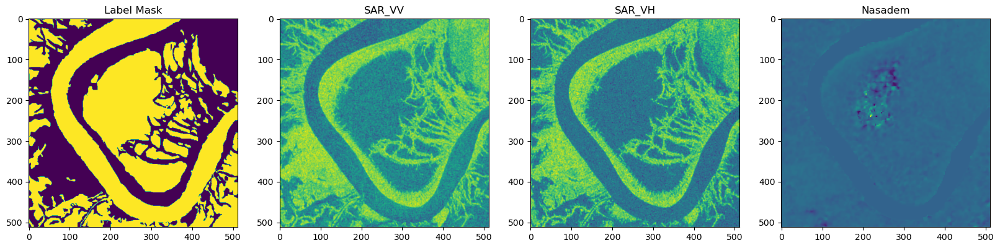

In [4]:
# visualisations
for fn in filenames[15:16]:
    
    with rasterio.open('training_data/train_features/{}_vv.tif'.format(fn)) as fvv:
        vv = fvv.read(1)
    with rasterio.open('training_data/train_features/{}_vh.tif'.format(fn)) as fvh:
        vh = fvh.read(1)
    with rasterio.open('training_data/train_features/{}_nasadem.tif'.format(fn)) as nasadem_:
        nasadem = nasadem_.read(1)
    with rasterio.open('training_data/train_labels/{}.tif'.format(fn)) as label:
        mask = label.read(1)

    _, ax = plt.subplots(1, 4, figsize=(20, 7))
    ax[0].imshow(mask)
    ax[1].imshow(vv)
    ax[2].imshow(vh)
    ax[3].imshow(nasadem)
    ax[0].title.set_text('Label Mask')
    ax[1].title.set_text('SAR_VV')
    ax[2].title.set_text('SAR_VH')
    ax[3].title.set_text('Nasadem')
    plt.show()

Let's explore by location

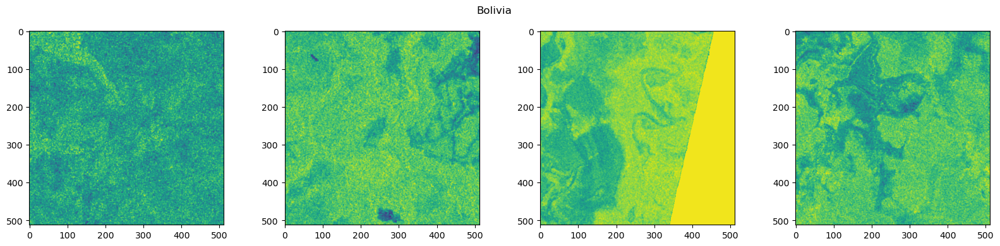

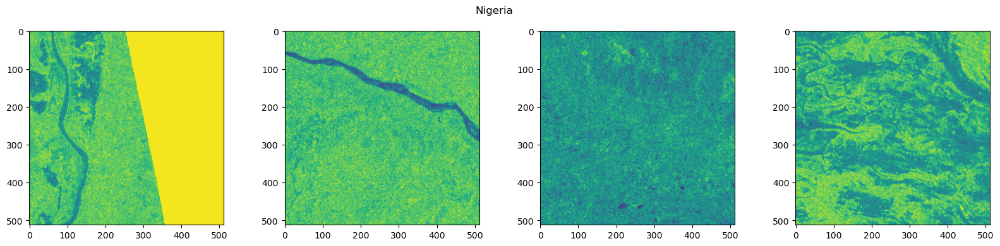

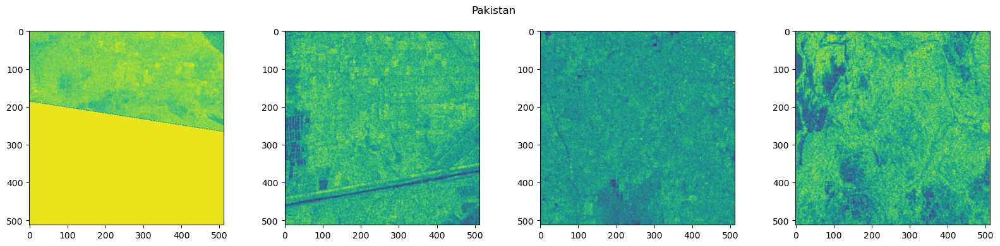

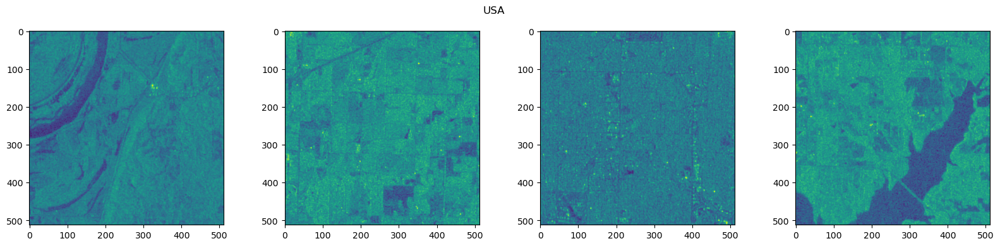

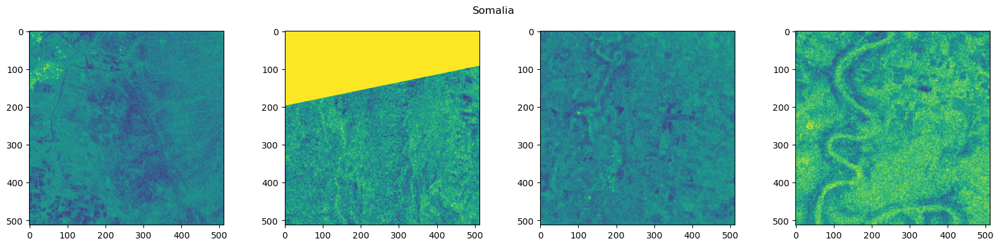

...

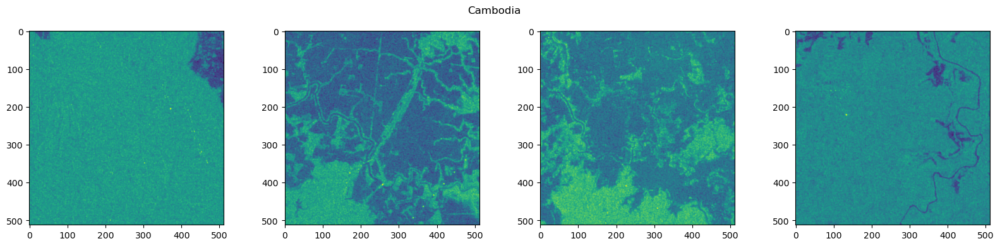

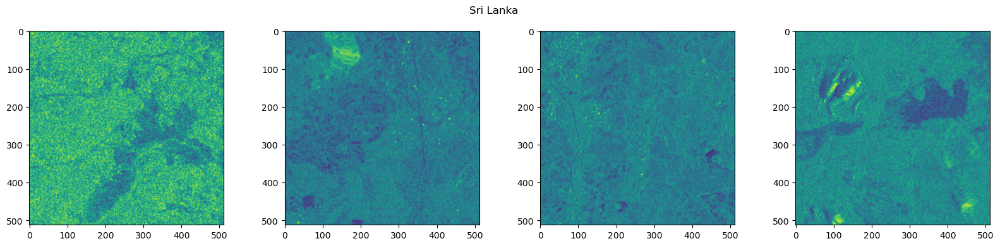

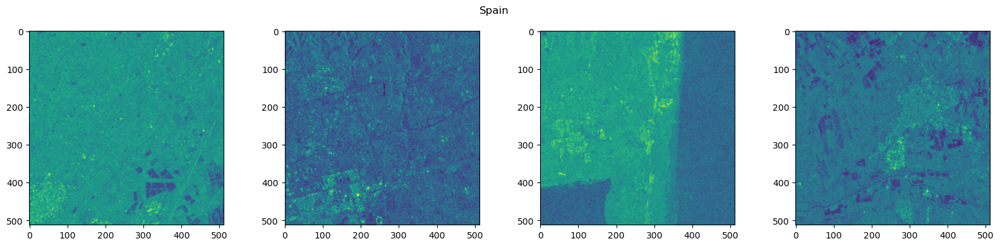

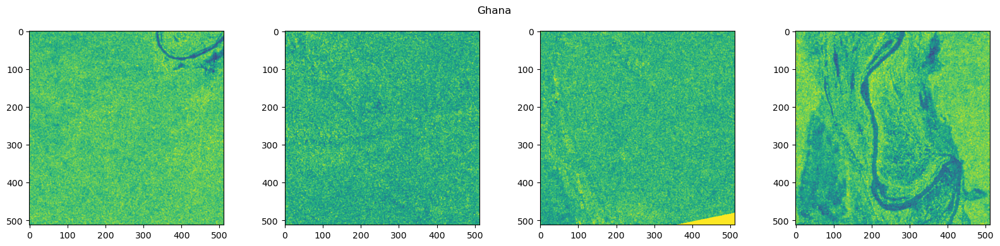

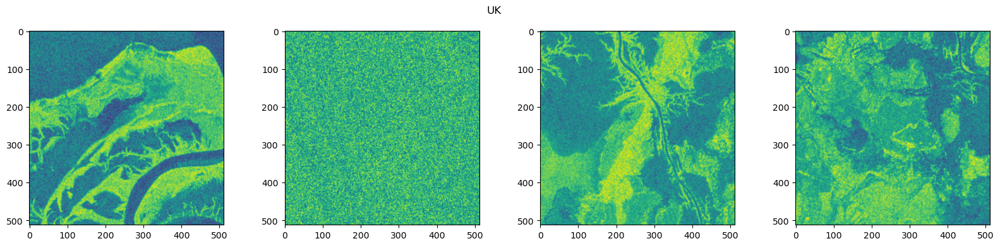

In [7]:
# Degree of flooding depends on location? Yes - vv only here
for loc in train_metadata.location.unique():
    paths = train_metadata[train_metadata.location == loc].sample(4)['chip_id'].iloc[:]
    _, ax = plt.subplots(1, 4, figsize=(20,4))
    
    for i, path in enumerate(paths):
        with rasterio.open('training_data/train_features/{}_vv.tif'.format(path)) as fvv:
            vv = fvv.read(1)
            
        ax[i].imshow(vv)
    plt.suptitle(loc)

In [19]:
# 255 means empty zones in the photos, so convert them to 0
def process_mask(mask):
    mask_temp = mask.copy()
    mask_temp[mask == 255] = 0
    return mask_temp

In [6]:
all_masks = []
locate = []
floodly = []
pathly = []

for loc in tqdm(train_metadata.location.unique()):
    
    paths = train_metadata[train_metadata.location == loc].chip_id.values
    
    for i, path in enumerate(paths):

        mask = process_mask(gdal.Open('training_data/train_labels/{}.tif'.format(path)).ReadAsArray())
        
        all_masks.append(mask)
        locate.append(loc)
        floodly.append(mask.sum() / (512*512))
        pathly.append(path)
        
flood_eda = pd.DataFrame()
flood_eda['path'] = pathly
flood_eda['location'] = locate
flood_eda['floodly'] = floodly #how floodly that place is


100%|██████████| 13/13 [00:01<00:00,  8.59it/s]


In [7]:
flood_eda.groupby('location').floodly.describe().sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
location,,,,,,,,
Slovakia,130.0,0.018061,0.045395,0.000000,0.000000,0.002762,0.009850,0.309711
USA,138.0,0.045430,0.066888,0.000629,0.007526,0.013943,0.065514,0.324692
Somalia,52.0,0.051354,0.063109,0.000000,0.000000,0.022242,0.108318,0.224854
Ghana,106.0,0.062545,0.156007,0.000000,0.000000,0.002308,0.023003,0.760483
Pakistan,56.0,0.080402,0.120702,0.000000,0.000318,0.022778,0.087570,0.397087
Paraguay,132.0,0.120797,0.164322,0.000000,0.003437,0.039627,0.188091,0.643555
Sri Lanka,84.0,0.123861,0.211806,0.000000,0.010132,0.058449,0.166531,0.981300
Spain,60.0,0.137300,0.188967,0.000904,0.011898,0.052517,0.247738,0.809994
India,136.0,0.142401,0.157174,0.000000,0.020671,0.079449,0.197027,0.648365


Some other visualisations:

In [12]:
filenames = [x.split('.')[0] for x in os.listdir('training_data/train_labels')]

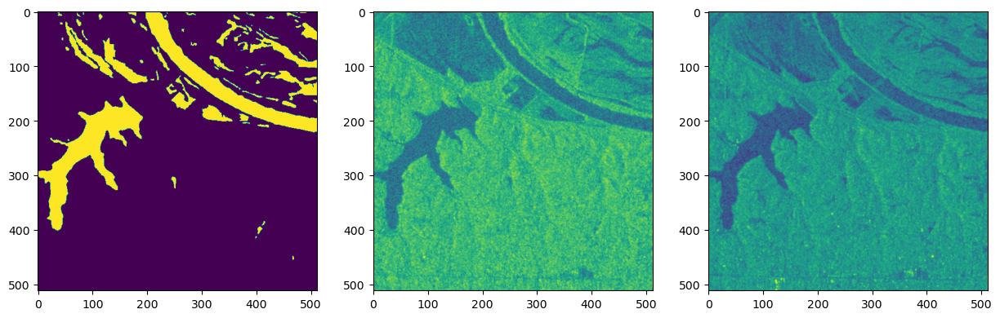

In [9]:
fn = filenames[4]

for fn in filenames[17:18]:
    with rasterio.open('training_data/train_features/{}_vv.tif'.format(fn)) as fvv:
        vv = fvv.read(1)
    with rasterio.open('training_data/train_features/{}_vh.tif'.format(fn)) as fvh:
        vh = fvh.read(1)
    with rasterio.open('training_data/train_labels/{}.tif'.format(fn)) as fmask:
        mask = fmask.read(1)
        
    _, ax = plt.subplots(1,3, figsize=(15,5))
    ax[0].imshow(mask)
    ax[1].imshow(vh)
    ax[2].imshow(vv)
    plt.show()

With augmentations done during training:

In [21]:
random.seed(123)

def augment_image(image, mask):

    transform = albumentations.Compose(
        [
        albumentations.RandomRotate90(),
        albumentations.HorizontalFlip(p=0.5),
        albumentations.VerticalFlip(p=0.5),
        albumentations.OneOf([
            albumentations.MotionBlur(p=0.2),
            albumentations.Blur(blur_limit=3, p=0.1),
        ], p=0.2)
        ]
    )
    augmented = transform(image=image, mask=mask)
    return augmented['image'], augmented['mask']

In [17]:
# And different combinations of image channel
class CustomDataGen(tf.keras.utils.Sequence):
    
    def __init__(self, paths,
                 augment=True,
                 batch_size=16,
                 input_shape=512,
                 shuffle=True,
                 channels=2):
        
        self.channels = channels
        self.paths = paths
        self.augment = augment
        self.batch_size = batch_size
        self.input_shape = input_shape
        self.shuffle = shuffle
        self.n = len(self.paths)
        self.on_epoch_end()
        
    
    def on_epoch_end(self):
        
        self.indexes = np.arange(len(self.paths))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    
    def __load_data(self, paths):
    
        X_batch = []
        y_batch = []
        
        for path in paths:

            with rasterio.open('training_data/train_features/{}_vv.tif'.format(path)) as fvv:
                vv = fvv.read(1)
            with rasterio.open('training_data/train_features/{}_vh.tif'.format(path)) as fvh:
                vh = fvh.read(1)
            
            with rasterio.open('training_data/train_features/{}_nasadem.tif'.format(path)) as nasadem_:
                nasadem = nasadem_.read(1)
            with rasterio.open('training_data/train_features/{}_jrc-gsw-change.tif'.format(path)) as jrc_gsw_change_:
                jrc_gsw_change = jrc_gsw_change_.read(1)
            with rasterio.open('training_data/train_features/{}_jrc-gsw-extent.tif'.format(path)) as jrc_gsw_extent_:
                jrc_gsw_extent = jrc_gsw_extent_.read(1)
            with rasterio.open('training_data/train_features/{}_jrc-gsw-occurrence.tif'.format(path)) as jrc_gsw_occurrence_:
                jrc_gsw_occurrence = jrc_gsw_occurrence_.read(1)
            with rasterio.open('training_data/train_features/{}_jrc-gsw-recurrence.tif'.format(path)) as jrc_gsw_recurrence_:
                jrc_gsw_recurrence = jrc_gsw_recurrence_.read(1)
            with rasterio.open('training_data/train_features/{}_jrc-gsw-seasonality.tif'.format(path)) as jrc_gsw_seasonality_:
                jrc_gsw_seasonality = jrc_gsw_seasonality_.read(1)
            with rasterio.open('training_data/train_features/{}_jrc-gsw-transitions.tif'.format(path)) as jrc_gsw_transitions_:
                jrc_gsw_transitions = jrc_gsw_transitions_.read(1)
            
            with rasterio.open('training_data/train_labels/{}.tif'.format(path)) as fmask:
                mask = process_mask(fmask.read(1))
            
            if self.channels == 2:
                X = np.zeros((512, 512, 2))
                X[:, :, 0] = (vh - (-17.54)) / 5.15
                X[:, :, 1] = (vv - (-10.68)) / 4.62
                
            elif self.channels == 3:
                X = np.zeros((512, 512, 3))
                X[:, :, 0] = (vh - (-17.54)) / 5.15
                X[:, :, 1] = (vv - (-10.68)) / 4.62
                X[:, :, 2] = (nasadem - (166.47)) / 178.47
                
            elif self.channels == 9:
                X = np.zeros((512, 512, 9))
                X[:, :, 0] = (vh - (-17.54)) / 5.15
                X[:, :, 1] = (vv - (-10.68)) / 4.62
                X[:, :, 2] = (nasadem - (166.47)) / 178.47
                X[:, :, 3] = (jrc_gsw_change - 238.76) / 45.45
                X[:, :, 4] = (jrc_gsw_occurrence - 6.50) / 29.06
                X[:, :, 5] = (jrc_gsw_extent - 2.15) / 22.71
                X[:, :, 6] = (jrc_gsw_recurrence - 10.04) / 33.21
                X[:, :, 7] = (jrc_gsw_seasonality - 2.60) / 22.79
                X[:, :, 8] = (jrc_gsw_transitions - 0.55) / 1.94
            
            y = mask.copy()
            
            if self.augment:
                X, y = augment_image(X, mask)
                
            X_batch.append(X)
            y_batch.append(y)
            
        return np.array(X_batch, dtype=float), np.array(y_batch, dtype=float)
    
    
    def __getitem__(self, index):
        
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        X, y = self.__load_data([self.paths[i] for i in indexes])        
        
        return X, y
    
    
    def __len__(self):
        
        return int(np.floor(len(self.paths) / self.batch_size))

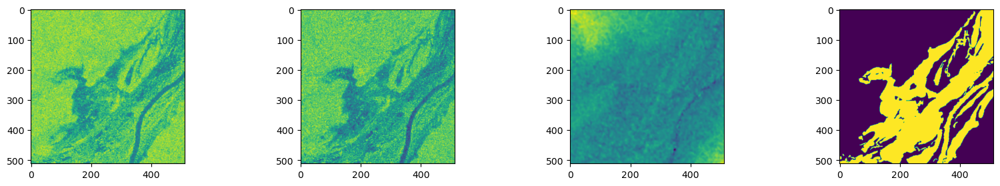

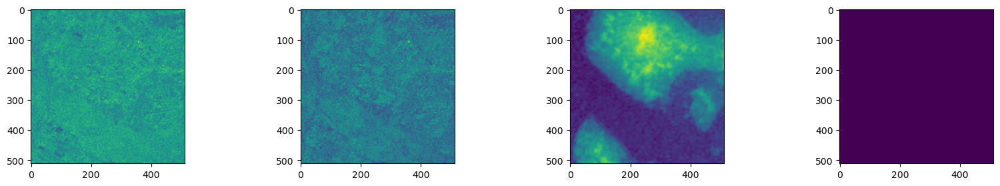

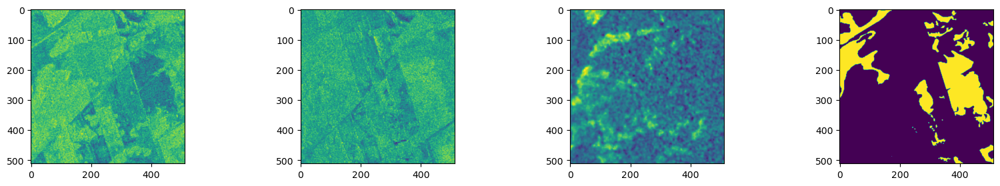

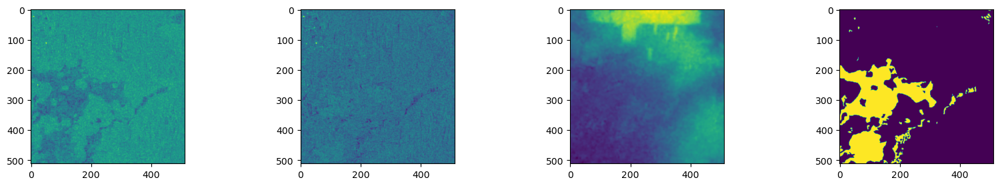

In [25]:
traingen = CustomDataGen(filenames, channels=3, input_shape=521, batch_size=4)

for x, y in traingen:
    break

i=0
for xx, yy in zip(x,y):
    _, ax = plt.subplots(1, 4, figsize=(20,3))
    for i in range(3):
        ax[i].imshow(xx[:,:,i])
    ax[3].imshow(yy)
    plt.show()